In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import tqdm
import os
import wandb
import copy

In [12]:
class CNN_mnist(nn.Module):
    def __init__(self):
        super(CNN_mnist, self).__init__()
        
        #Block 1
        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),  # 28x28 → 28x28
            nn.ReLU(),
            nn.MaxPool2d(2)                               # 28x28 → 14x14
        )
        
        #Block 2
        self.conv2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1), # 14x14 → 14x14
            nn.ReLU(),
            nn.MaxPool2d(2)                               # 14x14 → 7x7
        )
        
        # Fully Connected Layers
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 7 * 7, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, 10)                           # 10 output classes
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.fc(x)
        return x

        
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))  #MNIST mean & std
])

Using device: cuda


In [6]:
full_train_dataset = datasets.MNIST(root='./data', train=True,  download=True, transform=transform)
test_dataset       = datasets.MNIST(root='./data', train=False, download=True, transform=transform)
train_size = 50000
val_size   = 10000

train_dataset, val_dataset = random_split(
    full_train_dataset, 
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42)  # reproducible split
)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader   = DataLoader(val_dataset,   batch_size=64, shuffle=False)
test_loader  = DataLoader(test_dataset,  batch_size=64, shuffle=False)

print(f"Train samples:      {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
print(f"Test samples:       {len(test_dataset)}")

Train samples:      50000
Validation samples: 10000
Test samples:       10000


In [5]:
def train_one_epoch(model, loader, optimizer, criterion, epoch):
    model.train()
    total_loss, correct = 0, 0

    for batch_idx, (images, labels) in enumerate(loader):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        correct += (outputs.argmax(1) == labels).sum().item()
    accuracy = 100 * correct / len(loader.dataset)
    avg_loss = total_loss / len(loader)
    return avg_loss, accuracy

@torch.no_grad()
def evaluate(model, loader, criterion):
    model.eval()
    total_loss, correct = 0, 0

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            total_loss += criterion(outputs, labels).item()
            correct += (outputs.argmax(1) == labels).sum().item()

    accuracy = 100 * correct / len(loader.dataset)
    avg_loss = total_loss / len(loader)
    return avg_loss, accuracy


def train(model, train_loader, val_loader, criterion, optimizer, device, tag, num_epochs=10, early_stopping_patience=3, scheduler=None):
    model.to(device)
    best_val_loss = 1000000000000
    epochs_without_improvement = 0
    train_losses, val_losses, val_accuracies = [], [], []
    best_model = None
    for epoch in range(num_epochs):
        train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion, epoch)
        val_loss, val_accuracy = evaluate(model, val_loader, criterion)
        if scheduler:
            scheduler.step(val_loss)#remove val_loss depending on if the scheduler needs it or not
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_without_improvement = 0
            best_model = copy.deepcopy(model)
            torch.save(best_model.state_dict(), f'{tag}_best_model.pth') #saves the best model dict to file in case of crashes or memory issues
        else:
            epochs_without_improvement += 1
        if epochs_without_improvement >= early_stopping_patience:
            print(f'Early stopping at epoch {epoch+1}')
            break

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)
        wandb.log({"Train Loss": train_loss, "Train Accuracy": train_acc, "Val Loss": val_loss, "Val Accuracy": val_accuracy, "epoch": epoch+1, "LR": scheduler.get_last_lr()})
        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%')
    return train_losses, val_losses, val_accuracies, best_model

In [9]:
LR = 0.001
BATCH_SIZE = 64
NUM_EPOCHS = 10000
EARLY_STOP = 75

In [10]:
model = CNN_mnist()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LR)

#Reduce LR if validation loss plateaus
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)



In [12]:
wandb.init(project="Lab2_task4", name="CNN_model", config={
    "learning_rate": LR,
    "batch_size": BATCH_SIZE,
    "epochs": NUM_EPOCHS,
    "early_stopping": EARLY_STOP,
})
t_loss, v_loss, v_acc, model = train(model, train_loader, val_loader, criterion, optimizer, device, 'CNN_mnist model', num_epochs=NUM_EPOCHS, early_stopping_patience=EARLY_STOP, scheduler=scheduler)
wandb.finish()

wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /root/.netrc.
wandb: Currently logged in as: linneahejsupergroup (linneahejsupergroup-lule-university-of-technology) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Epoch [1/10000], Train Loss: 0.2538, Val Loss: 0.0866, Val Accuracy: 97.38%
Epoch [2/10000], Train Loss: 0.0913, Val Loss: 0.0589, Val Accuracy: 98.28%
Epoch [3/10000], Train Loss: 0.0667, Val Loss: 0.0560, Val Accuracy: 98.57%
Epoch [4/10000], Train Loss: 0.0532, Val Loss: 0.0392, Val Accuracy: 98.96%
Epoch [5/10000], Train Loss: 0.0446, Val Loss: 0.0386, Val Accuracy: 98.97%
Epoch [6/10000], Train Loss: 0.0397, Val Loss: 0.0360, Val Accuracy: 98.96%
Epoch [7/10000], Train Loss: 0.0334, Val Loss: 0.0445, Val Accuracy: 98.91%
Epoch [8/10000], Train Loss: 0.0302, Val Loss: 0.0458, Val Accuracy: 98.81%
Epoch [9/10000], Train Loss: 0.0291, Val Loss: 0.0414, Val Accuracy: 98.96%
Epoch [10/10000], Train Loss: 0.0250, Val Loss: 0.0349, Val Accuracy: 99.17%
Epoch [11/10000], Train Loss: 0.0217, Val Loss: 0.0407, Val Accuracy: 99.07%
Epoch [12/10000], Train Loss: 0.0205, Val Loss: 0.0379, Val Accuracy: 99.12%
Epoch [13/10000], Train Loss: 0.0185, Val Loss: 0.0432, Val Accuracy: 99.16%
Epoch [1

Train Accuracy,▁▃▄▄▅▆▇▇▇▇▇█████████████████████████████
Train Loss,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Val Accuracy,▁▆▆▅▆▆▇▇▇▇▇█▇███▇███████████████████████
Val Loss,█▃▂▂▁▁▁▂▂▁▂▂▂▂▃▂▃▃▃▃▃▃▃▃▃▃▄▃▄▄▄▄▄▄▄▄▄▄▄▄
epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇███
Train Accuracy,99.96
Train Loss,0.00117
Val Accuracy,99.26
Val Loss,0.05731
epoch,84


In [13]:
model = CNN_mnist()
model.load_state_dict(torch.load("CNN_mnist model_best_model.pth"))
model.to(device)
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f"  Test Loss: {test_loss:.4f} | Test Accuracy: {test_acc:.2f}%")

  Test Loss: 0.0282 | Test Accuracy: 99.18%


In [23]:
wandb.finish()

Train Accuracy,▁█
Train Loss,█▁
Val Accuracy,▁█
Val Loss,█▁
epoch,▁█
Train Accuracy,97.586
Train Loss,0.08208
Val Accuracy,98.55
Val Loss,0.04546
epoch,2


In [9]:
fours = []

for img, label in test_dataset:
    if label == 4:
        fours.append(img.unsqueeze(0))  # add batch dim: (1, 28, 28) → (1, 1, 28, 28)
    if len(fours) >= 10:
        break
print(f"Collected {len(fours)} images of digit 4")

Collected 10 images of digit 4


In [6]:
def create_plot_adversarial_images(model, x_image, y_label, lr=0.1, n_steps=1, output_probs=False):
    """
    PyTorch equivalent of the TensorFlow FGSM adversarial image generator.
    
    Args:
        model:        Trained CNN model
        x_image:      Input image tensor, shape (1, 1, 28, 28)
        y_label:      Target class index (e.g. 9)
        lr:           Total perturbation magnitude
        n_steps:      Number of iterative attack steps
        output_probs: If True, records and returns class probabilities per step
    """
    device = next(model.parameters()).device
    model.eval()  # Disables dropout — equivalent to keep_prob: 1.0

    criterion     = nn.CrossEntropyLoss()
    original_image = x_image.clone().to(device)
    x_adv          = x_image.clone().to(device)
    target         = torch.tensor([y_label]).to(device)
    step_size      = lr / n_steps  # mirrors: lr/n_steps in the TF code

    probs_per_step = []

    for step in range(n_steps):

        # ── Forward pass ────────────────────────────────────────────────
        x_adv.requires_grad = True          # equivalent to: tf.gradients(loss, x)
        output = model(x_adv)

        # ── Compute loss toward target class ────────────────────────────
        loss = criterion(output, target)    # equivalent to: tf.nn.softmax_cross_entropy_with_logits

        # ── Backprop to get gradients w.r.t. input image ────────────────
        model.zero_grad()
        loss.backward()
        dydx = x_adv.grad.data               # equivalent to: dydx = sess.run(deriv, ...)

        # ── Create adversarial image ─────────────────────────────────────
        with torch.no_grad():
            x_adv = x_adv - step_size * dydx.sign()    # equivalent to: x - tf.sign(deriv)*lr/n_steps
            x_adv = torch.clamp(x_adv, 0, 1)           # equivalent to: tf.clip_by_value(image_adv, 0, 1)

        # ── Build 3-image array for plotting ────────────────────────────
        # Equivalent to the np.append block in the TF code:
        #   Row 0 → original image
        #   Row 1 → gradient/noise (dydx)
        #   Row 2 → adversarial image
        #   We do this to be able to plot the images using matplot
        orig_np  = original_image.cpu().squeeze().detach().numpy()   # (28, 28)
        noise_np = dydx.cpu().squeeze().detach().numpy()             # (28, 28)
        adv_np   = x_adv.cpu().squeeze().detach().numpy()            # (28, 28)

        img_adv_list = np.stack([orig_np, noise_np, adv_np], axis=0) # shape: (3, 28, 28)

        # ── Get class probabilities ──────────────────────────────────────
        with torch.no_grad():
            probs = torch.softmax(model(x_adv), dim=1).cpu().numpy()[0]  # shape: (10,)

        # ── Plot the 3 images + predictions ─────────────────────────────
        plot_predictions(img_adv_list, probs, step, n_steps, output_probs)

        if output_probs:
            probs_per_step.append(probs)

    return probs_per_step



def plot_predictions(img_adv_list, probs, step, n_steps, output_probs):
    """
    Plots original, noise/delta, and adversarial image side by side,
    plus a bar chart of class probabilities.
    Equivalent to plot_predictions() called in the TF version.
    """
    titles    = ["Original", "Gradient / Noise (δ)", "Adversarial"]
    pred_class = np.argmax(probs)

    fig, axes = plt.subplots(1, 4, figsize=(16, 3))
    fig.suptitle(f"Step {step + 1}/{n_steps}  |  Prediction: {pred_class}  ({probs[pred_class]:.2%} confidence)",
                 fontsize=13, fontweight='bold')

    for i in range(3):
        img = img_adv_list[i]

        # Normalise noise panel to [0,1] for display
        if i == 1:
            img = (img - img.min()) / (img.max() - img.min() + 1e-8)

        axes[i].imshow(img, cmap='gray', vmin=0, vmax=1)
        axes[i].set_title(titles[i], fontsize=11)
        axes[i].axis('off')

    # Probability bar chart
    axes[3].barh(range(10), probs, color=['tomato' if i == pred_class else 'steelblue' for i in range(10)])
    axes[3].set_yticks(range(10))
    axes[3].set_yticklabels([str(i) for i in range(10)])
    axes[3].set_xlim(0, 1)
    axes[3].set_title("Class Probabilities", fontsize=11)
    axes[3].set_xlabel("Probability")

    plt.tight_layout()
    plt.savefig(f"adversarial_step_{step+1}.png", dpi=150)
    plt.show()

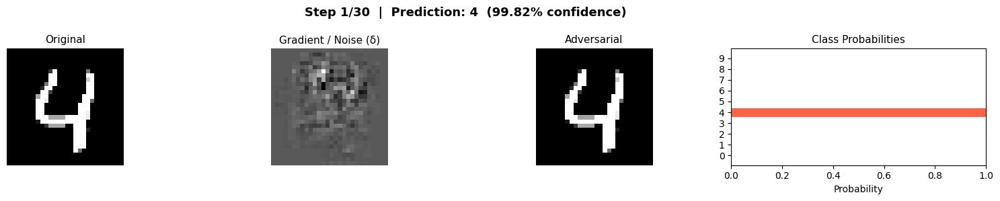

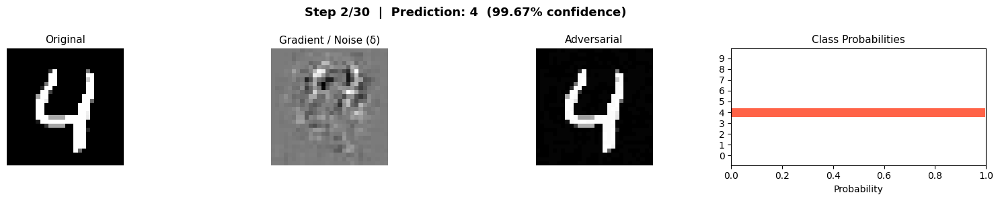

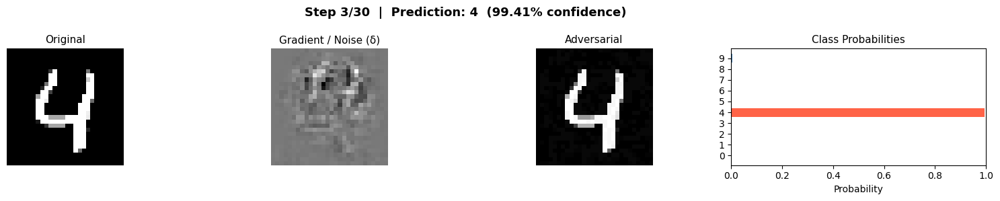

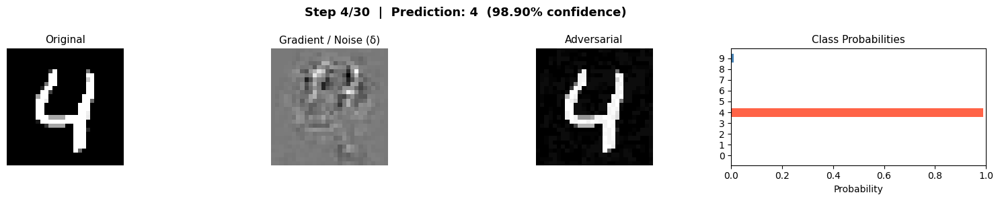

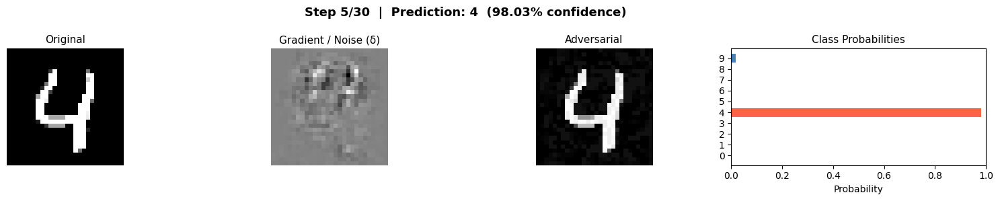

...

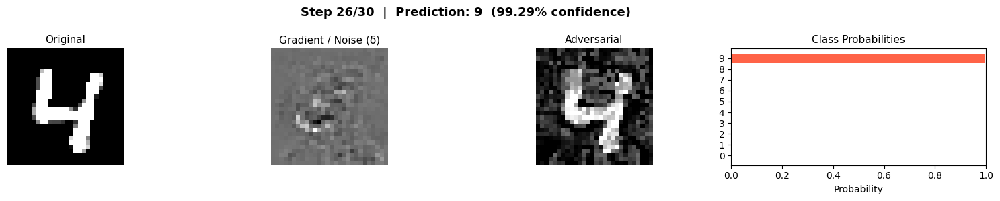

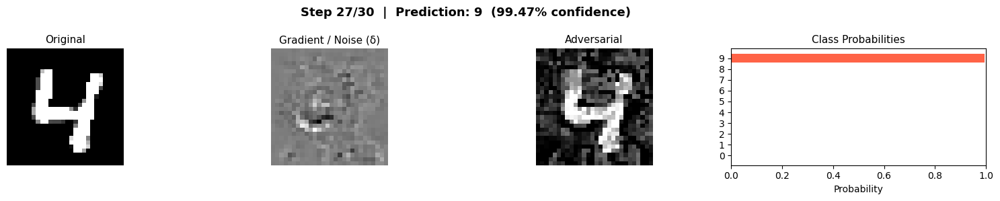

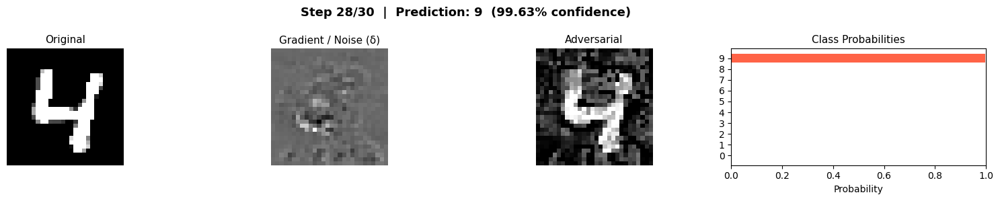

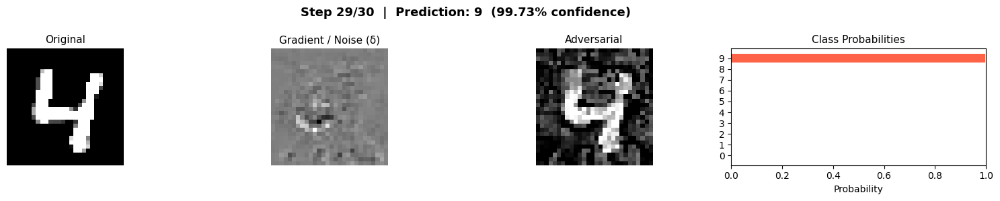

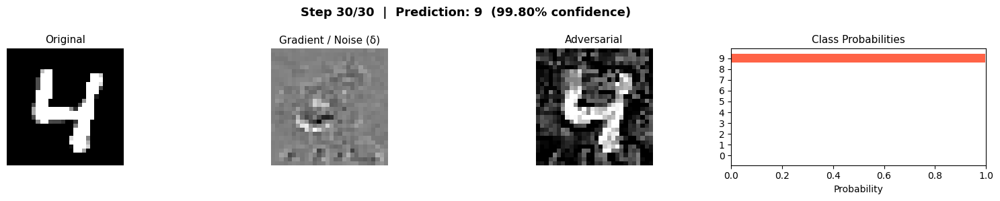


Successfully fooled: 0/10 images


In [10]:
model = CNN_mnist()
model.load_state_dict(torch.load("/Lab2/CNN_mnist model_best_model.pth"))

probs = []
for i, image in enumerate(fours):
    trying = create_plot_adversarial_images(model, image, 9, lr=0.5, n_steps=30, output_probs=True)
    probs.append(trying)



print(f"\nSuccessfully fooled: {success}/{len(fours)} images")

In [15]:
success = sum(1 for prob in probs if np.argmax(prob[-1]) == 9)
print(f"\nSuccessfully fooled: {success}/{len(fours)} images")


Successfully fooled: 10/10 images


In [17]:
model.to(device)
torch.manual_seed(42)  # reproducibility

# Random noise in [0, 1] — same shape as MNIST image (1, 1, 28, 28)
noise_image = torch.rand(1, 1, 28, 28).to(device)

print(f"Noise image shape: {noise_image.shape}")
print(f"Pixel value range: [{noise_image.min():.3f}, {noise_image.max():.3f}]")

# ─────────────────────────────────────────
# 2. Check Initial Prediction on Noise
# ─────────────────────────────────────────
model.eval()

with torch.no_grad():
    output     = model(noise_image)
    probs      = torch.softmax(output, dim=1).cpu().numpy()[0]
    pred_class = np.argmax(probs)

print(f"\nInitial prediction on pure noise: {pred_class} ({probs[pred_class]:.2%} confidence)")
print(f"Confidence for class 9:           {probs[9]:.2%}")

# ─────────────────────────────────────────
# 3. Iterative Gradient Descent to Fool
#    Model into Predicting 9
# ─────────────────────────────────────────
criterion  = nn.CrossEntropyLoss()
target     = torch.tensor([9]).to(device)

LR         = 0.1
NUM_STEPS  = 500

def createFromRandom(model, device, noise_image, NUM_STEPS, LR, criterion, target):
    x_noise    = noise_image.clone().to(device)
    original_noise = noise_image.clone()  # keep original for comparison
    
    probs_history = []  # track confidence for class 9 over steps
    
    for step in range(NUM_STEPS):
    
        # Forward pass
        x_noise.requires_grad = True
        output = model(x_noise)
        probs  = torch.softmax(output, dim=1)
    
        pred_class = output.argmax(1).item()
        confidence = probs[0][9].item()
        probs_history.append(confidence)
    
        # Stop if model predicts 9 with high confidence
        if pred_class == 9 and confidence > 0.99:
            print(f"\n✔ Target reached at step {step+1} (confidence: {confidence:.2%})")
            break
    
        # Compute loss toward target class 9
        loss = criterion(output, target)
    
        # Backprop to get gradients w.r.t. input noise image
        model.zero_grad()
        loss.backward()
        dydx = x_noise.grad.data
    
        # Update noise image — same FGSM step as Step 3
        with torch.no_grad():
            x_noise = x_noise - LR * dydx.sign()
            x_noise = torch.clamp(x_noise, 0, 1)
    
        if step % 50 == 0:
            print(f"  Step {step:>4} | Pred: {pred_class} | Conf for 9: {confidence:.2%}")
    
    # Final prediction
    with torch.no_grad():
        final_output = model(x_noise)
        final_probs  = torch.softmax(final_output, dim=1).cpu().numpy()[0]
        final_pred   = np.argmax(final_probs)
    
    print(f"\nFinal prediction: {final_pred} ({final_probs[final_pred]:.2%} confidence)")
    
    # ─────────────────────────────────────────
    # 4. Visualise Results
    # ─────────────────────────────────────────
    orig_np  = original_noise.cpu().squeeze().numpy()         # original noise
    delta_np = (x_noise - noise_image).cpu().squeeze().detach().numpy()  # total perturbation
    adv_np   = x_noise.cpu().squeeze().detach().numpy()       # final adversarial noise
    
    fig, axes = plt.subplots(1, 4, figsize=(16, 3))
    fig.suptitle(f"Random Noise → Classified as {final_pred} ({final_probs[final_pred]:.2%} confidence)",
                 fontsize=13, fontweight='bold')
    
    # Original noise
    axes[0].imshow(orig_np, cmap='gray', vmin=0, vmax=1)
    axes[0].set_title("Original Random Noise")
    axes[0].axis('off')
    
    # Total perturbation applied
    delta_display = (delta_np - delta_np.min()) / (delta_np.max() - delta_np.min() + 1e-8)
    axes[1].imshow(delta_display, cmap='RdBu', vmin=0, vmax=1)
    axes[1].set_title("Total Perturbation (δ)")
    axes[1].axis('off')
    
    # Final adversarial noise image
    axes[2].imshow(adv_np, cmap='gray', vmin=0, vmax=1)
    axes[2].set_title(f"Adversarial Noise\nPred: {final_pred} ({final_probs[final_pred]:.2%})")
    axes[2].axis('off')
    
    # Class probability bar chart
    axes[3].barh(range(10), final_probs,
                 color=['tomato' if i == final_pred else 'steelblue' for i in range(10)])
    axes[3].set_yticks(range(10))
    axes[3].set_yticklabels([str(i) for i in range(10)])
    axes[3].set_xlim(0, 1)
    axes[3].set_title("Class Probabilities")
    axes[3].set_xlabel("Probability")
    
    plt.tight_layout()
    plt.savefig("random_noise_to_9.png", dpi=150)
    plt.show()
    
    # ─────────────────────────────────────────
    # 5. Plot Confidence for Class 9 Over Steps
    # ─────────────────────────────────────────
    plt.figure(figsize=(10, 4))
    plt.plot(probs_history, color='tomato', linewidth=2)
    plt.axhline(y=0.99, color='gray', linestyle='--', label='99% threshold')
    plt.xlabel("Step")
    plt.ylabel("Confidence for Class 9")
    plt.title("Confidence for Class 9 Over Gradient Steps")
    plt.legend()
    plt.tight_layout()
    plt.savefig("noise_confidence_over_steps.png", dpi=150)
    plt.show()

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.002, 1.000]

Initial prediction on pure noise: 8 (21.77% confidence)
Confidence for class 9:           10.96%


In [ ]:
torch.manual_seed(42)  # reproducibility

# Random noise in [0, 1] — same shape as MNIST image (1, 1, 28, 28)
noise_image = torch.rand(1, 1, 28, 28).to(device)

print(f"Noise image shape: {noise_image.shape}")
print(f"Pixel value range: [{noise_image.min():.3f}, {noise_image.max():.3f}]")

# ─────────────────────────────────────────
# 2. Check Initial Prediction on Noise
# ─────────────────────────────────────────
model.eval()

with torch.no_grad():
    output     = model(noise_image)
    probs      = torch.softmax(output, dim=1).cpu().numpy()[0]
    pred_class = np.argmax(probs)

print(f"\nInitial prediction on pure noise: {pred_class} ({probs[pred_class]:.2%} confidence)")
print(f"Confidence for class 9:           {probs[9]:.2%}")

# ─────────────────────────────────────────
# 3. Iterative Gradient Descent to Fool
#    Model into Predicting 9
# ─────────────────────────────────────────
criterion  = nn.CrossEntropyLoss()
target     = torch.tensor([9]).to(device)

LR         = 0.1
NUM_STEPS  = 500
def createFromRandom(model, device, noise_image, NUM_STEPS, LR, criterion, target)

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.001, 1.000]

Initial prediction on pure noise: 8 (21.11% confidence)
Confidence for class 9:           15.19%
  Step    0 | Pred: 8 | Conf for 9: 15.19%

✔ Target reached at step 4 (confidence: 99.84%)

Final prediction: 9 (99.84% confidence)


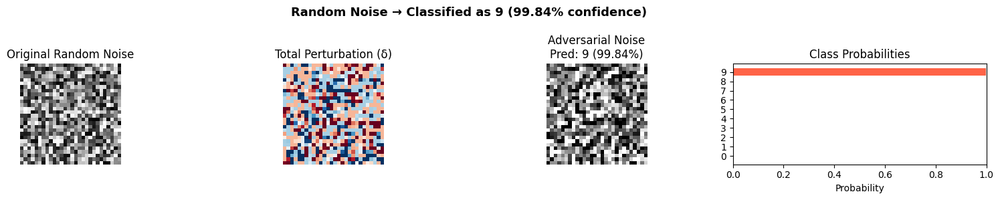

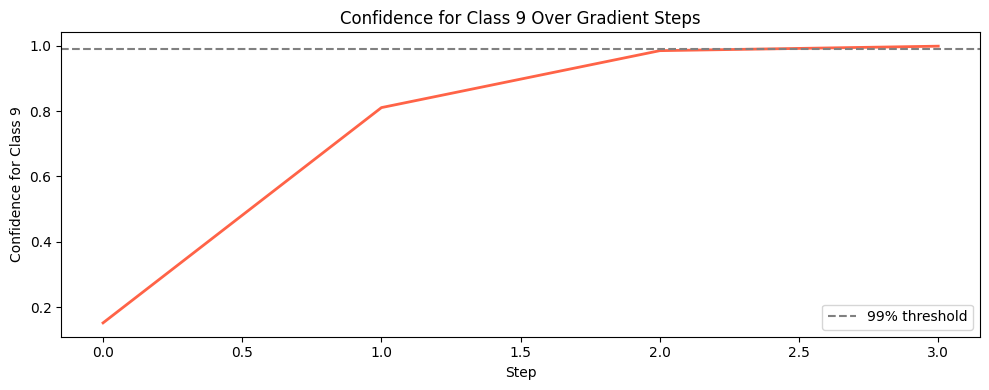

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.004, 0.999]

Initial prediction on pure noise: 9 (30.19% confidence)
Confidence for class 9:           30.19%
  Step    0 | Pred: 9 | Conf for 9: 30.19%

✔ Target reached at step 3 (confidence: 99.52%)

Final prediction: 9 (99.52% confidence)


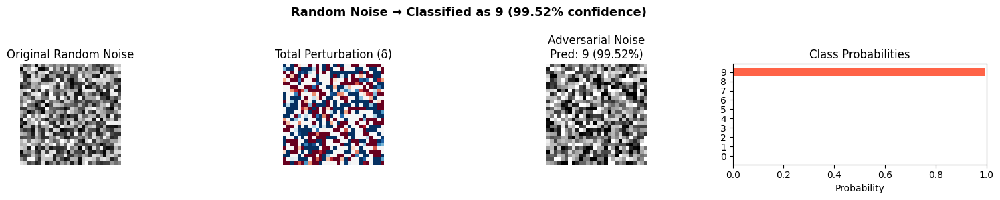

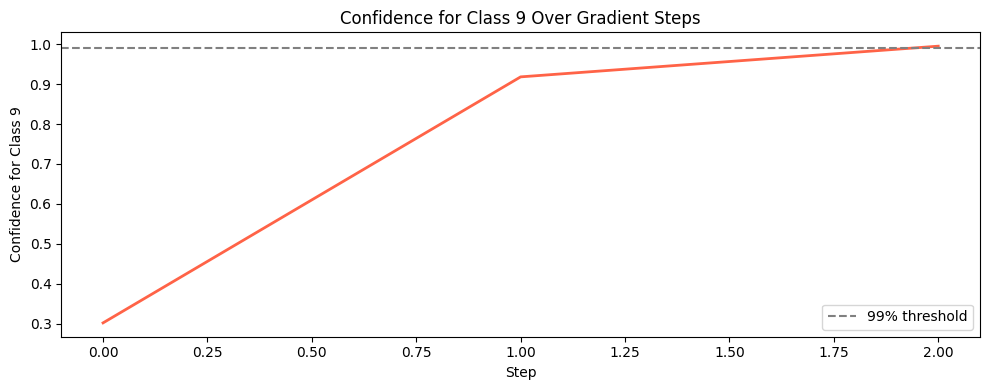

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.002, 0.999]

Initial prediction on pure noise: 8 (34.37% confidence)
Confidence for class 9:           10.09%
  Step    0 | Pred: 8 | Conf for 9: 10.09%

✔ Target reached at step 4 (confidence: 99.31%)

Final prediction: 9 (99.31% confidence)


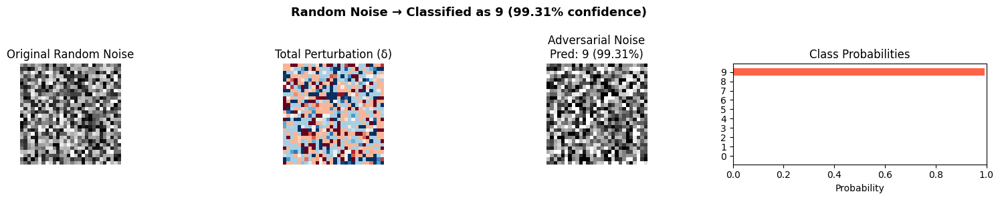

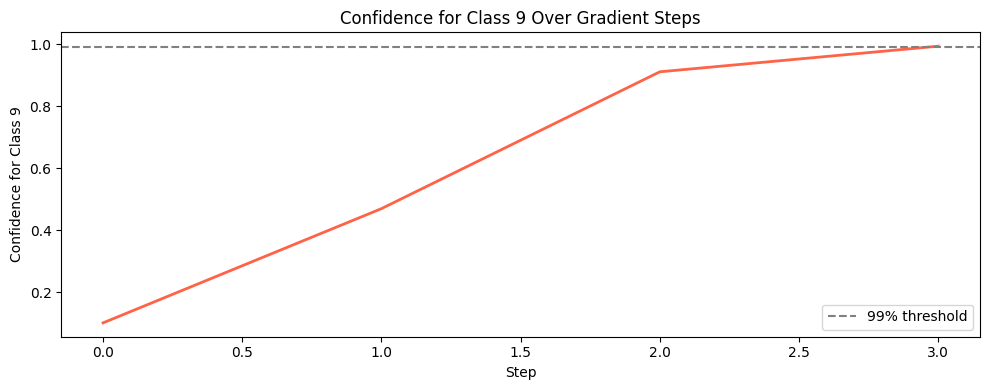

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.001, 1.000]

Initial prediction on pure noise: 8 (22.25% confidence)
Confidence for class 9:           8.68%
  Step    0 | Pred: 8 | Conf for 9: 8.68%

✔ Target reached at step 4 (confidence: 99.74%)

Final prediction: 9 (99.74% confidence)


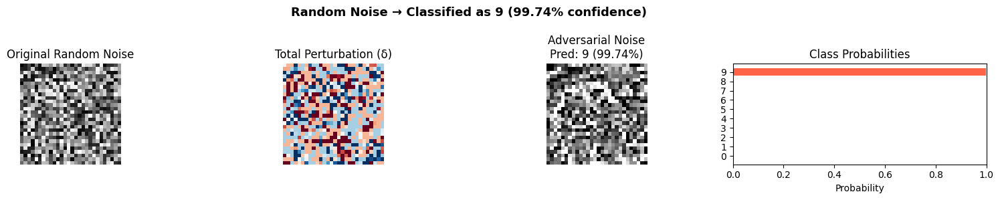

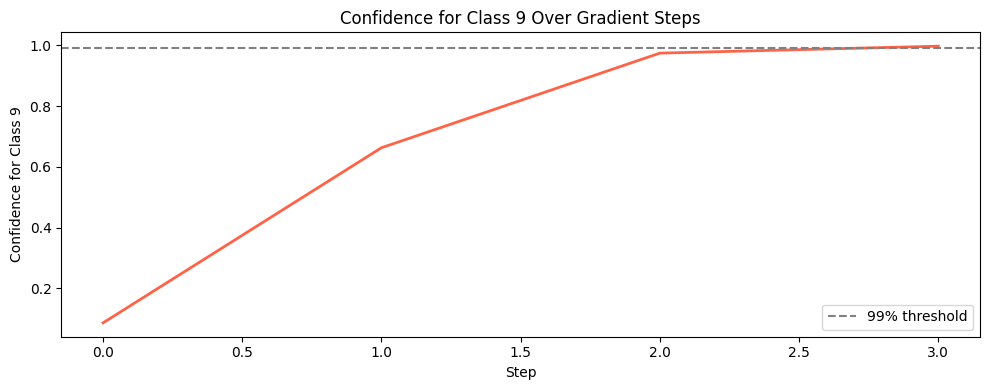

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.001, 0.999]

Initial prediction on pure noise: 8 (30.92% confidence)
Confidence for class 9:           9.57%
  Step    0 | Pred: 8 | Conf for 9: 9.57%

✔ Target reached at step 4 (confidence: 99.53%)

Final prediction: 9 (99.53% confidence)


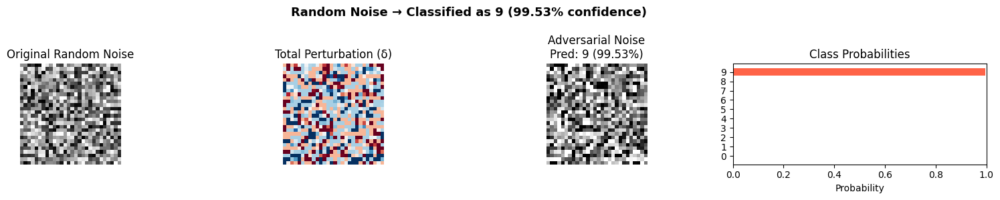

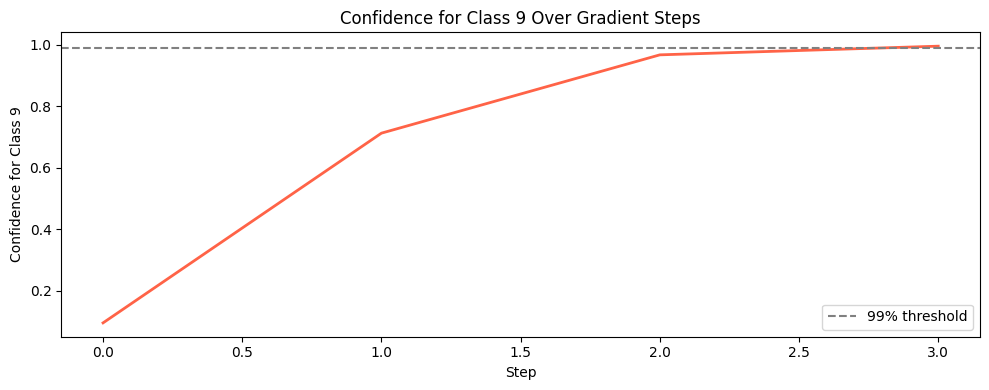

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.000, 0.997]

Initial prediction on pure noise: 8 (21.03% confidence)
Confidence for class 9:           18.95%
  Step    0 | Pred: 8 | Conf for 9: 18.95%

✔ Target reached at step 3 (confidence: 99.58%)

Final prediction: 9 (99.58% confidence)


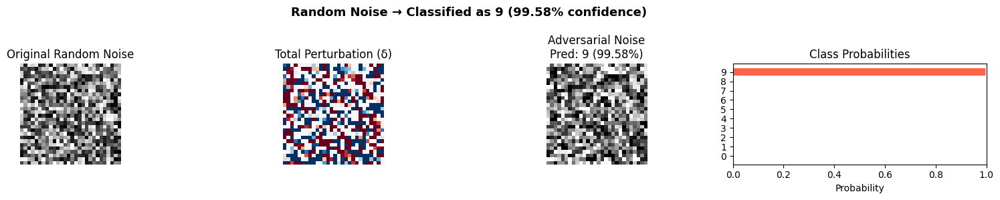

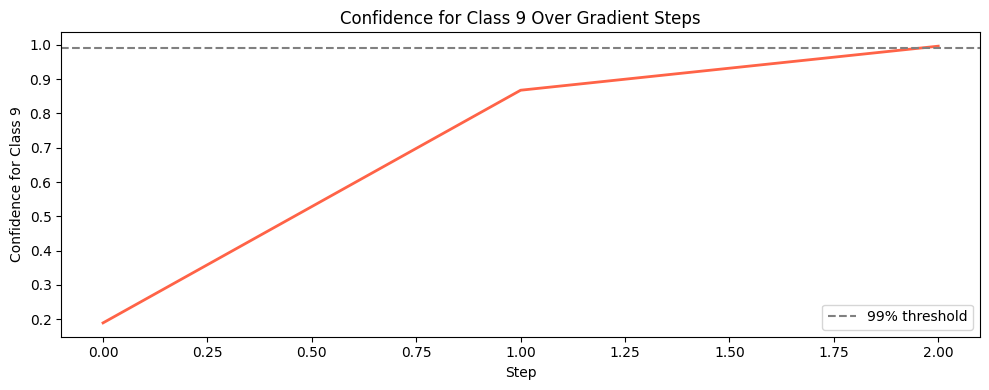

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.003, 0.998]

Initial prediction on pure noise: 0 (20.38% confidence)
Confidence for class 9:           13.55%
  Step    0 | Pred: 0 | Conf for 9: 13.55%

✔ Target reached at step 3 (confidence: 99.15%)

Final prediction: 9 (99.15% confidence)


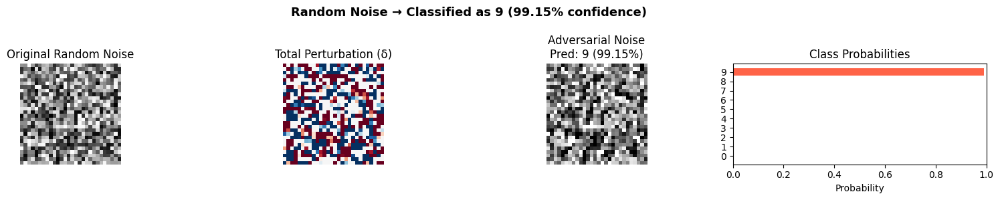

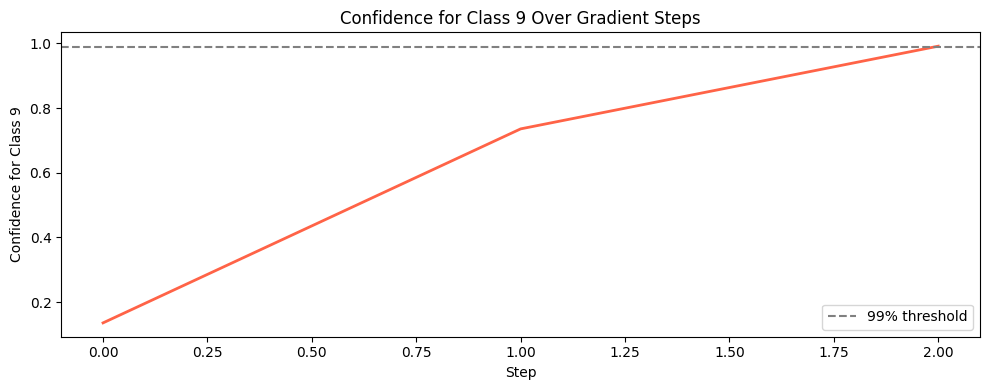

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.001, 1.000]

Initial prediction on pure noise: 8 (25.95% confidence)
Confidence for class 9:           24.83%
  Step    0 | Pred: 8 | Conf for 9: 24.83%

✔ Target reached at step 3 (confidence: 99.05%)

Final prediction: 9 (99.05% confidence)


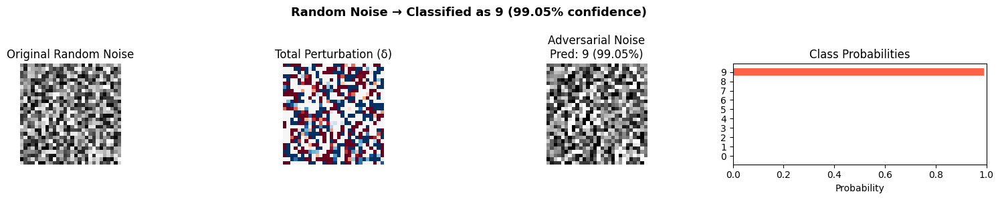

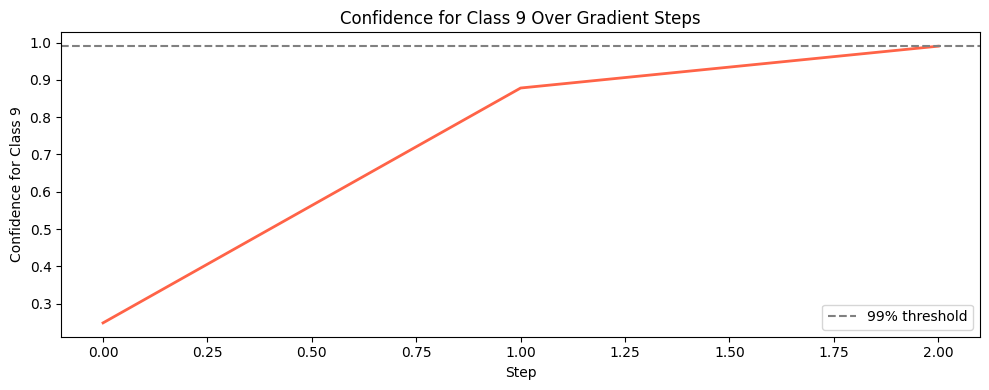

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.000, 0.999]

Initial prediction on pure noise: 8 (31.84% confidence)
Confidence for class 9:           11.11%
  Step    0 | Pred: 8 | Conf for 9: 11.11%

✔ Target reached at step 4 (confidence: 99.51%)

Final prediction: 9 (99.51% confidence)


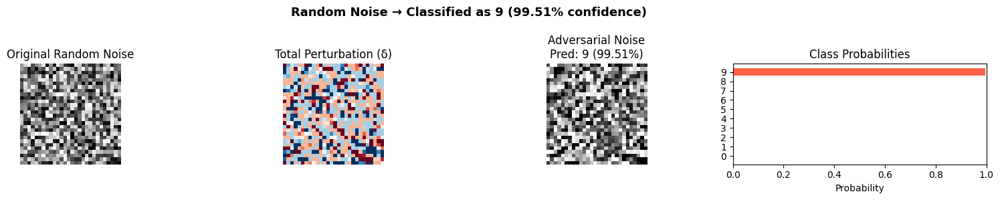

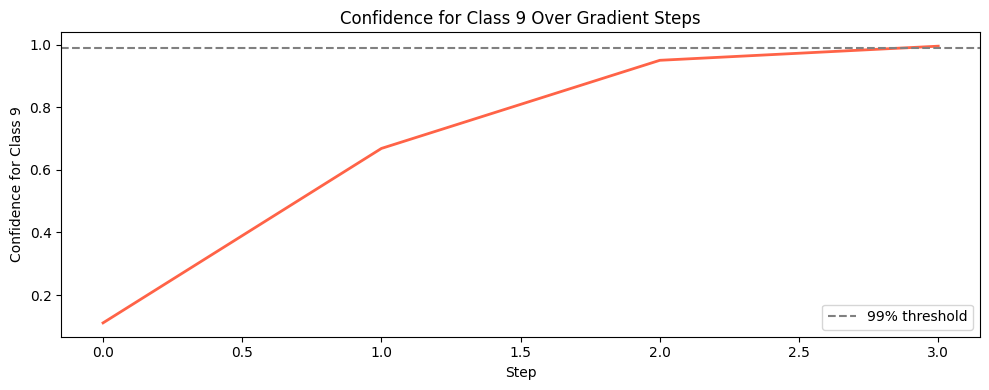

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.000, 1.000]

Initial prediction on pure noise: 8 (64.50% confidence)
Confidence for class 9:           6.32%
  Step    0 | Pred: 8 | Conf for 9: 6.32%

✔ Target reached at step 4 (confidence: 99.67%)

Final prediction: 9 (99.67% confidence)


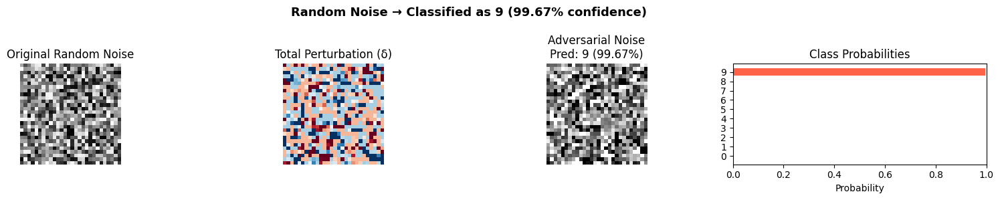

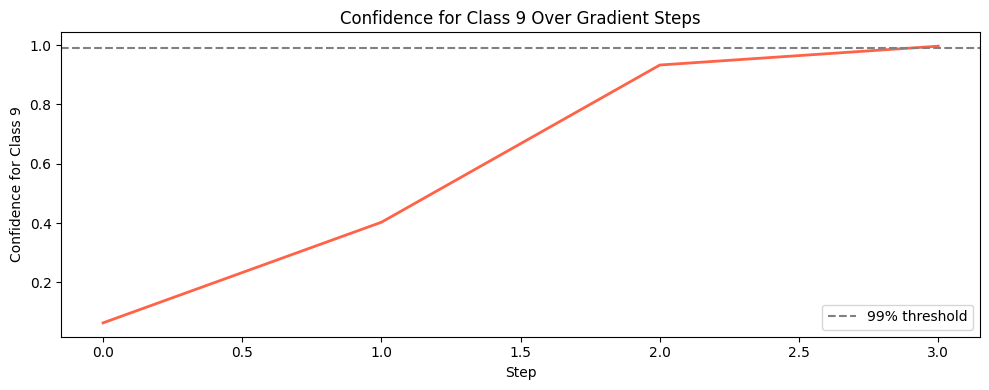

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.002, 0.999]

Initial prediction on pure noise: 8 (28.27% confidence)
Confidence for class 9:           15.68%
  Step    0 | Pred: 8 | Conf for 9: 15.68%

✔ Target reached at step 3 (confidence: 99.20%)

Final prediction: 9 (99.20% confidence)


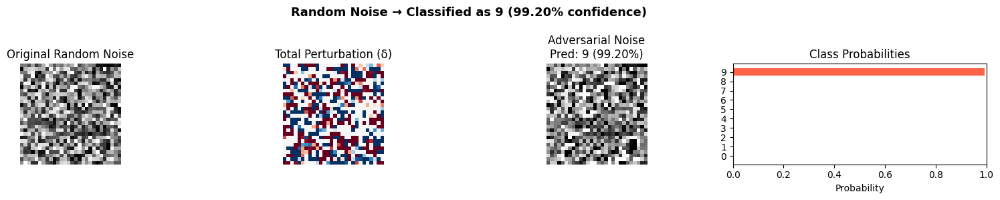

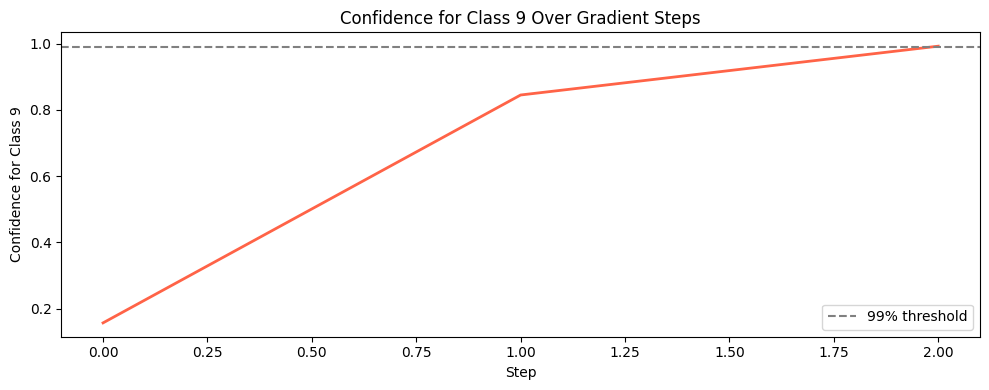

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.000, 0.996]

Initial prediction on pure noise: 8 (31.88% confidence)
Confidence for class 9:           6.62%
  Step    0 | Pred: 8 | Conf for 9: 6.62%

✔ Target reached at step 4 (confidence: 99.36%)

Final prediction: 9 (99.36% confidence)


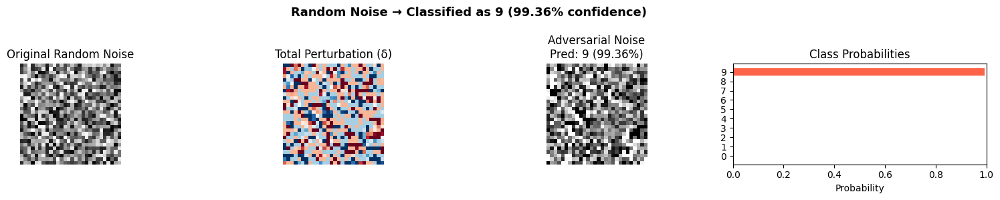

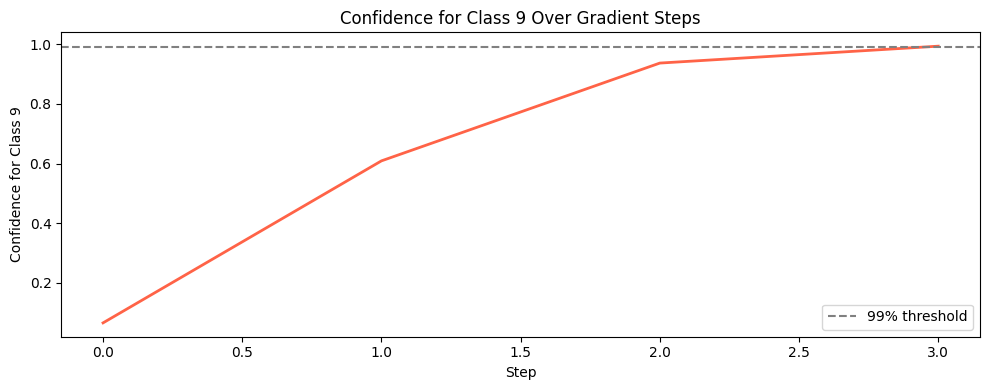

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.002, 0.995]

Initial prediction on pure noise: 9 (30.39% confidence)
Confidence for class 9:           30.39%
  Step    0 | Pred: 9 | Conf for 9: 30.39%

✔ Target reached at step 3 (confidence: 99.32%)

Final prediction: 9 (99.32% confidence)


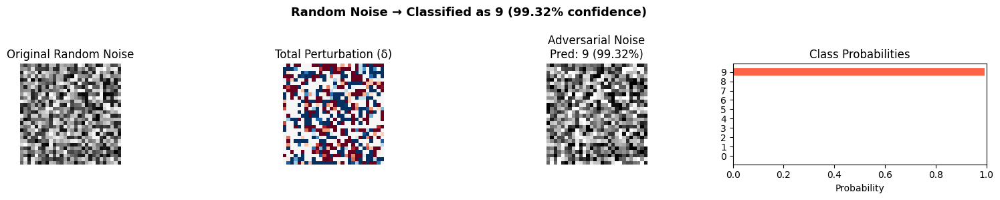

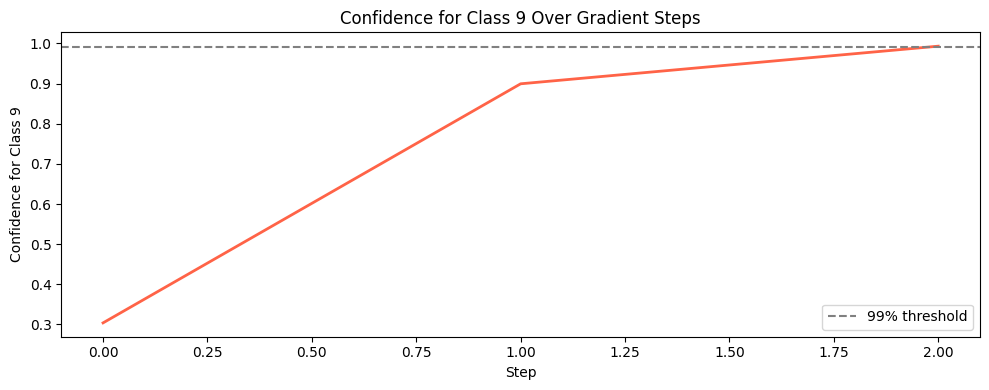

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.000, 0.999]

Initial prediction on pure noise: 8 (21.17% confidence)
Confidence for class 9:           13.49%
  Step    0 | Pred: 8 | Conf for 9: 13.49%

✔ Target reached at step 4 (confidence: 99.84%)

Final prediction: 9 (99.84% confidence)


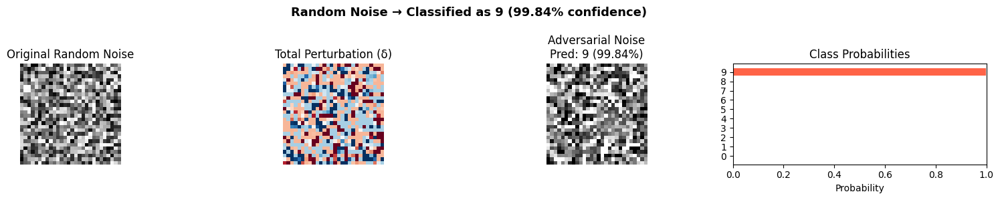

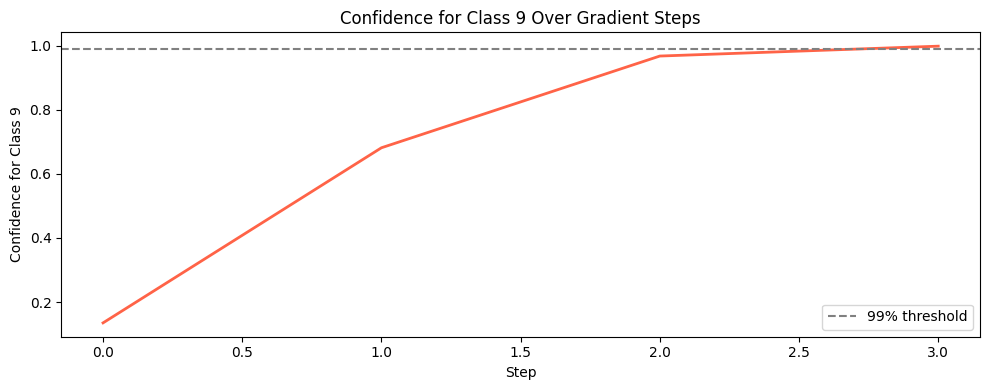

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.000, 0.999]

Initial prediction on pure noise: 8 (37.96% confidence)
Confidence for class 9:           9.88%
  Step    0 | Pred: 8 | Conf for 9: 9.88%

✔ Target reached at step 4 (confidence: 99.80%)

Final prediction: 9 (99.80% confidence)


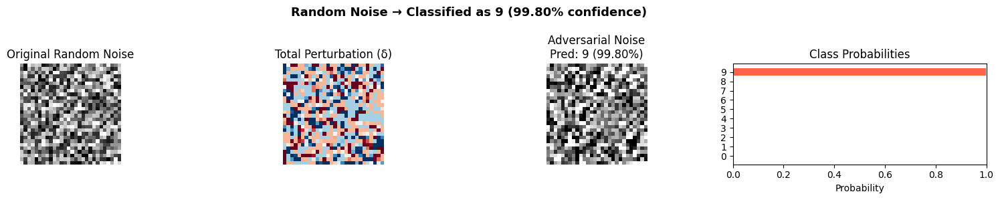

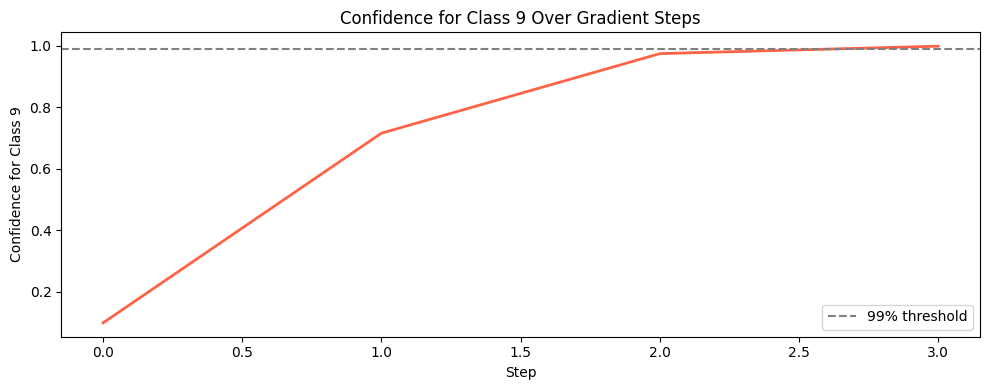

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.001, 0.997]

Initial prediction on pure noise: 9 (19.59% confidence)
Confidence for class 9:           19.59%
  Step    0 | Pred: 9 | Conf for 9: 19.59%

✔ Target reached at step 3 (confidence: 99.20%)

Final prediction: 9 (99.20% confidence)


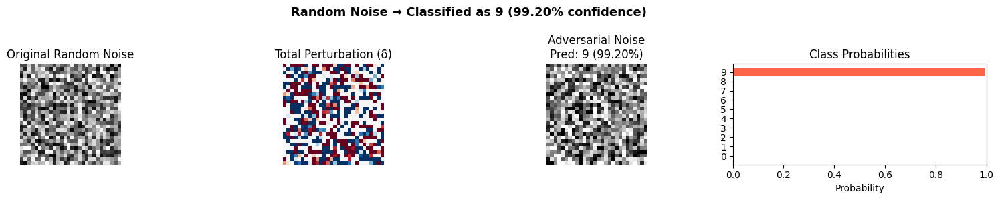

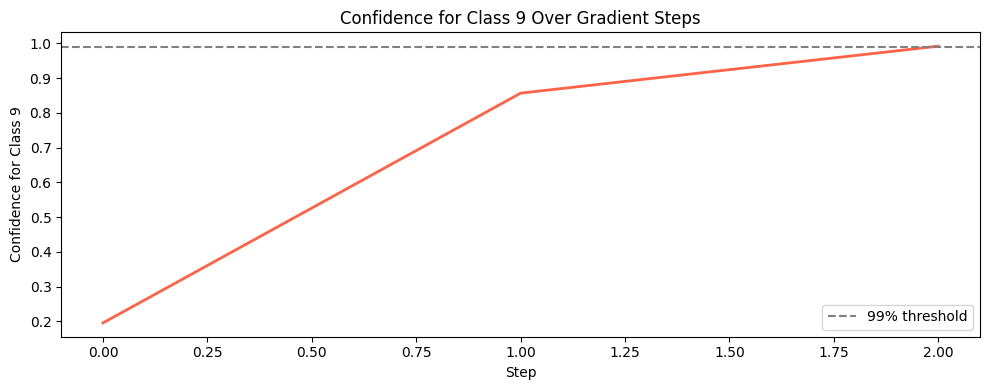

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.001, 1.000]

Initial prediction on pure noise: 9 (18.95% confidence)
Confidence for class 9:           18.95%
  Step    0 | Pred: 9 | Conf for 9: 18.95%

✔ Target reached at step 4 (confidence: 99.94%)

Final prediction: 9 (99.94% confidence)


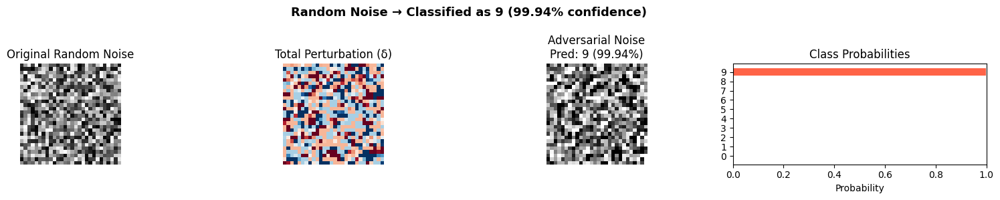

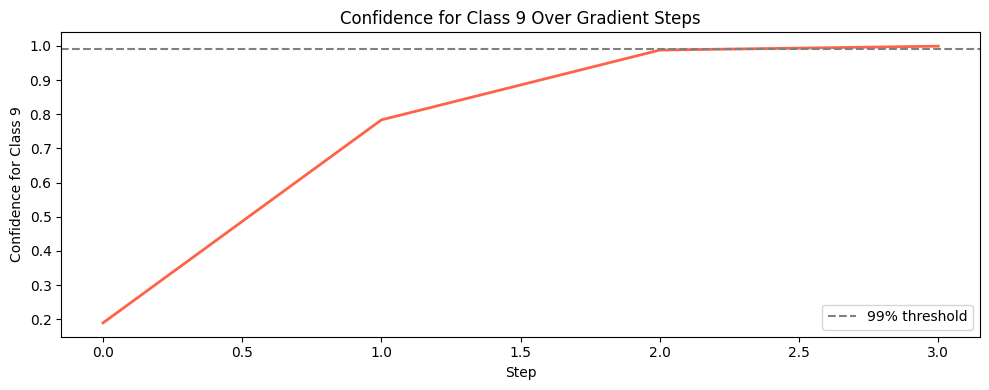

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.000, 0.998]

Initial prediction on pure noise: 0 (23.40% confidence)
Confidence for class 9:           10.56%
  Step    0 | Pred: 0 | Conf for 9: 10.56%

✔ Target reached at step 4 (confidence: 99.48%)

Final prediction: 9 (99.48% confidence)


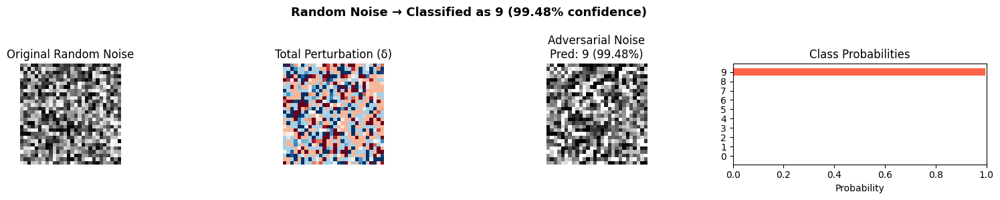

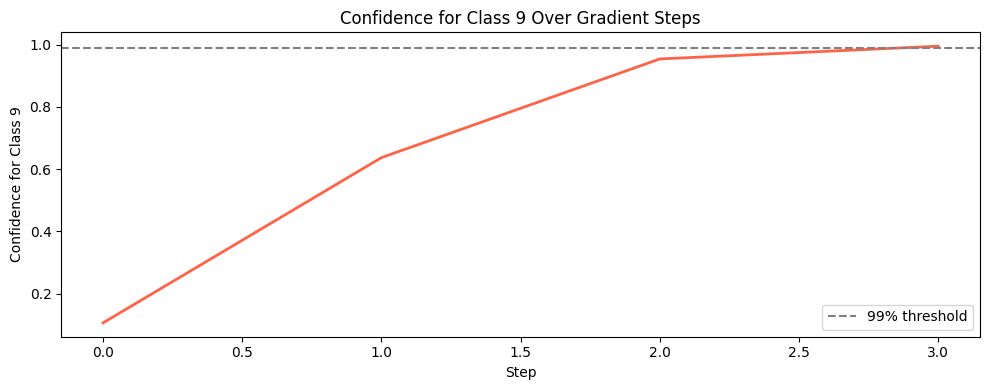

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.002, 1.000]

Initial prediction on pure noise: 8 (34.63% confidence)
Confidence for class 9:           11.52%
  Step    0 | Pred: 8 | Conf for 9: 11.52%

✔ Target reached at step 4 (confidence: 99.83%)

Final prediction: 9 (99.83% confidence)


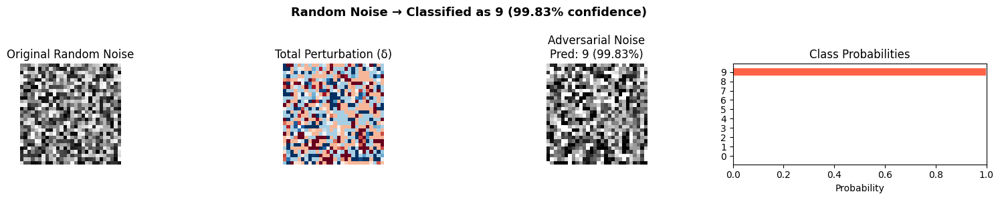

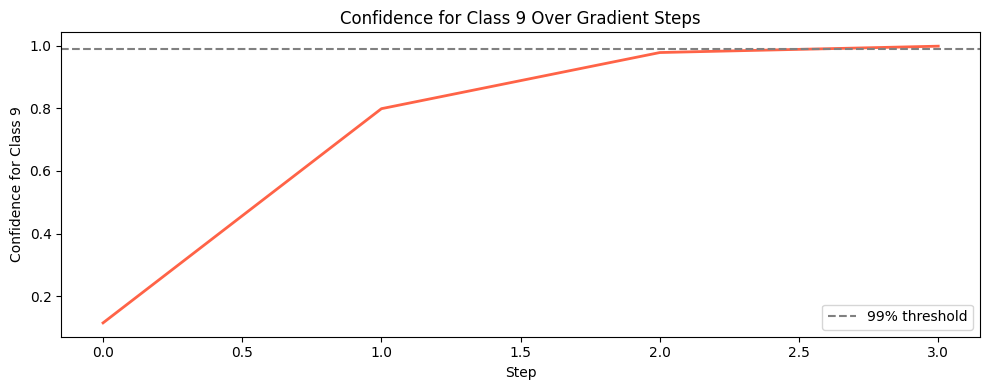

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.000, 0.998]

Initial prediction on pure noise: 8 (34.80% confidence)
Confidence for class 9:           17.34%
  Step    0 | Pred: 8 | Conf for 9: 17.34%

✔ Target reached at step 4 (confidence: 99.92%)

Final prediction: 9 (99.92% confidence)


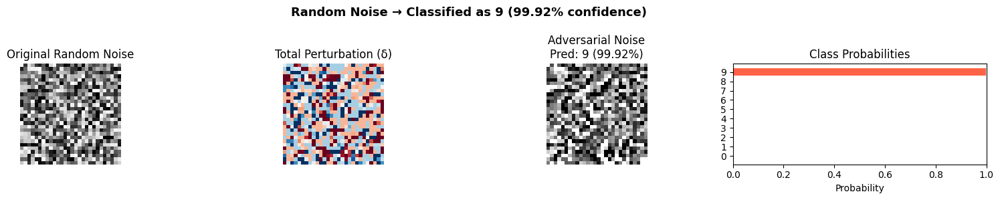

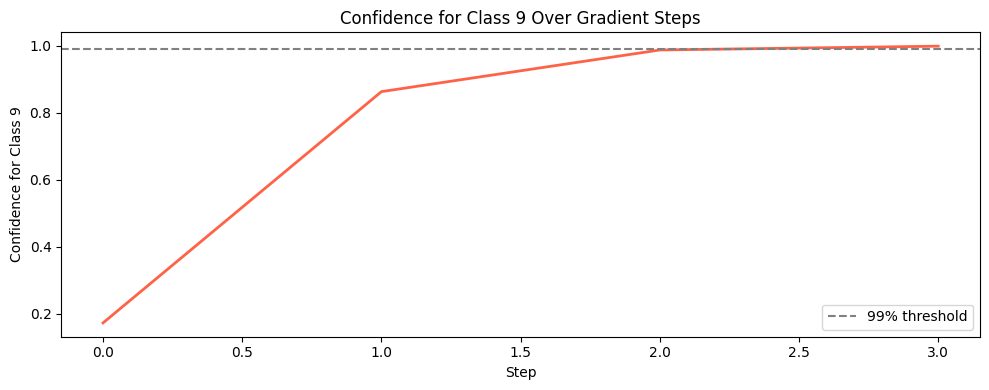

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.001, 0.998]

Initial prediction on pure noise: 8 (50.47% confidence)
Confidence for class 9:           4.66%
  Step    0 | Pred: 8 | Conf for 9: 4.66%

✔ Target reached at step 4 (confidence: 99.65%)

Final prediction: 9 (99.65% confidence)


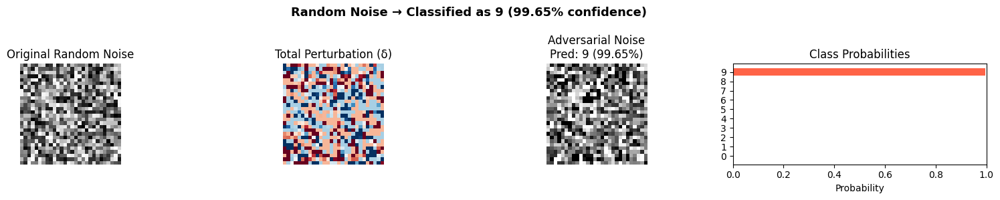

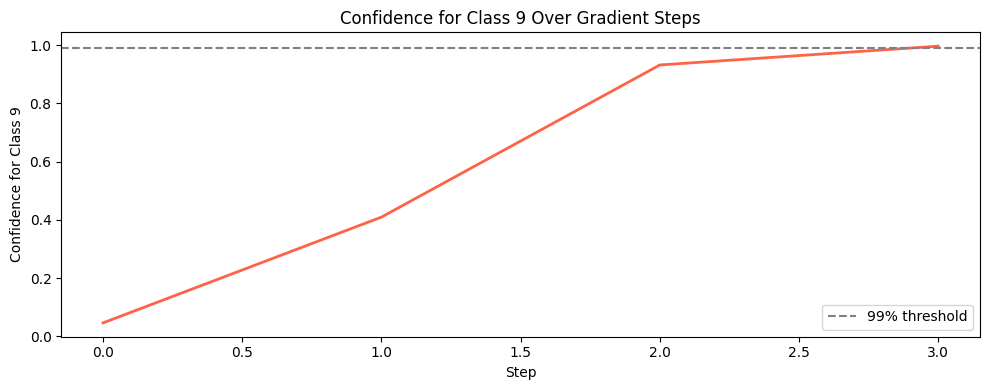

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.002, 0.998]

Initial prediction on pure noise: 8 (22.14% confidence)
Confidence for class 9:           14.43%
  Step    0 | Pred: 8 | Conf for 9: 14.43%

✔ Target reached at step 4 (confidence: 99.64%)

Final prediction: 9 (99.64% confidence)


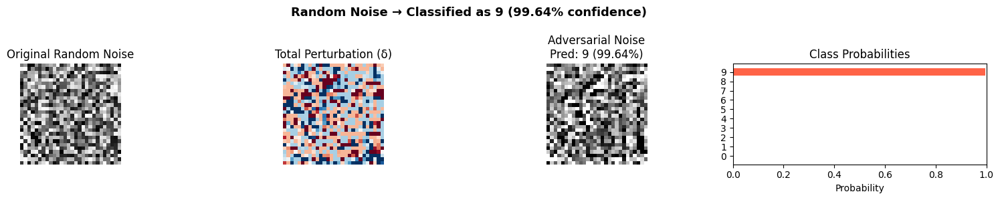

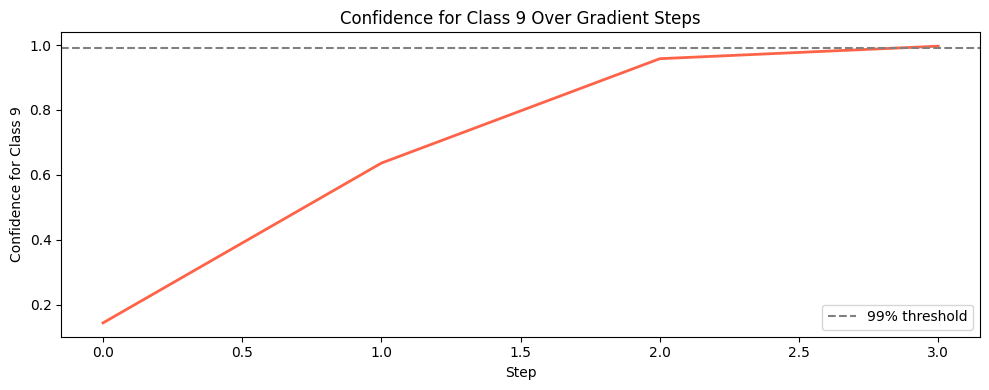

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.002, 1.000]

Initial prediction on pure noise: 8 (32.13% confidence)
Confidence for class 9:           10.47%
  Step    0 | Pred: 8 | Conf for 9: 10.47%

✔ Target reached at step 4 (confidence: 99.86%)

Final prediction: 9 (99.86% confidence)


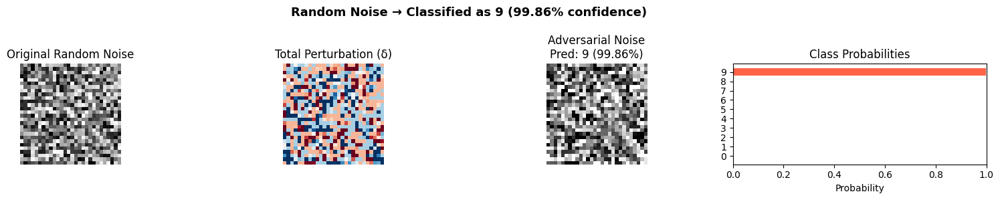

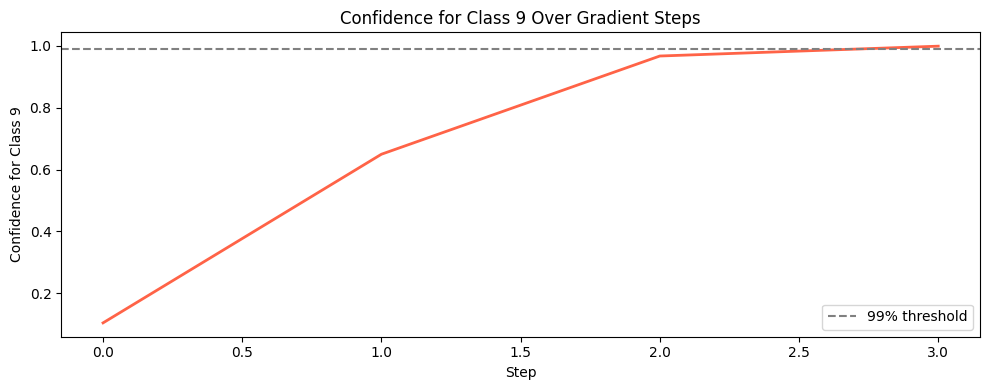

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.005, 0.997]

Initial prediction on pure noise: 8 (22.70% confidence)
Confidence for class 9:           18.83%
  Step    0 | Pred: 8 | Conf for 9: 18.83%

✔ Target reached at step 4 (confidence: 99.46%)

Final prediction: 9 (99.46% confidence)


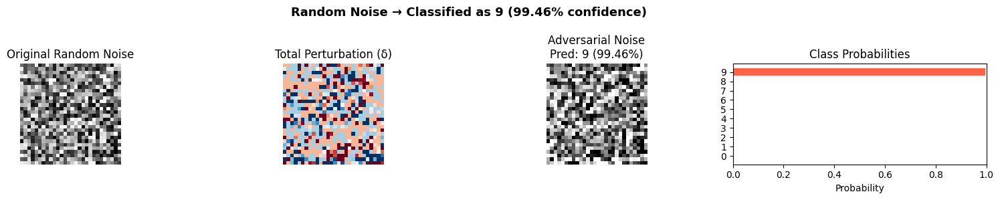

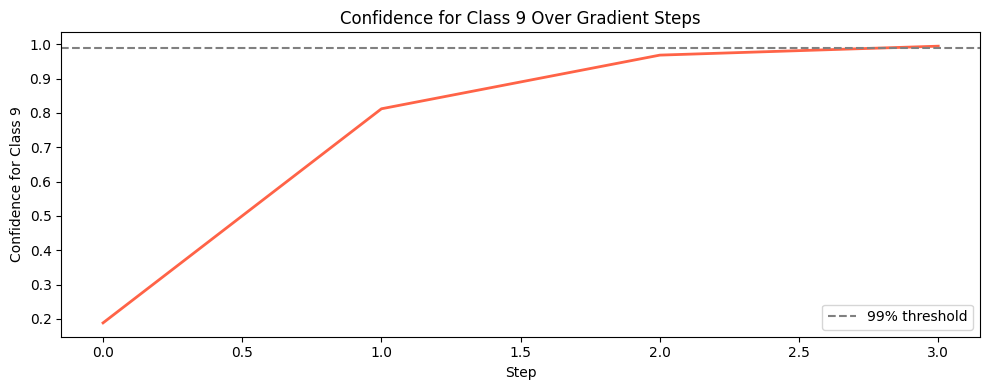

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.001, 1.000]

Initial prediction on pure noise: 8 (24.45% confidence)
Confidence for class 9:           15.89%
  Step    0 | Pred: 8 | Conf for 9: 15.89%

✔ Target reached at step 3 (confidence: 99.33%)

Final prediction: 9 (99.33% confidence)


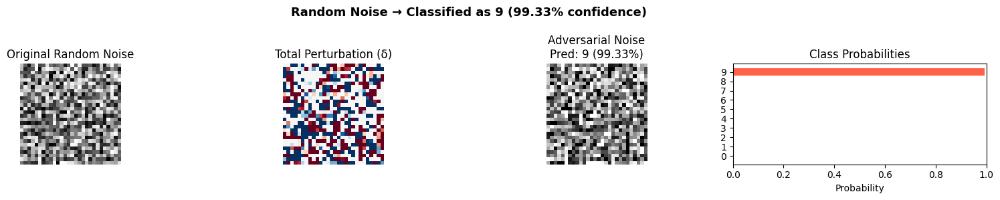

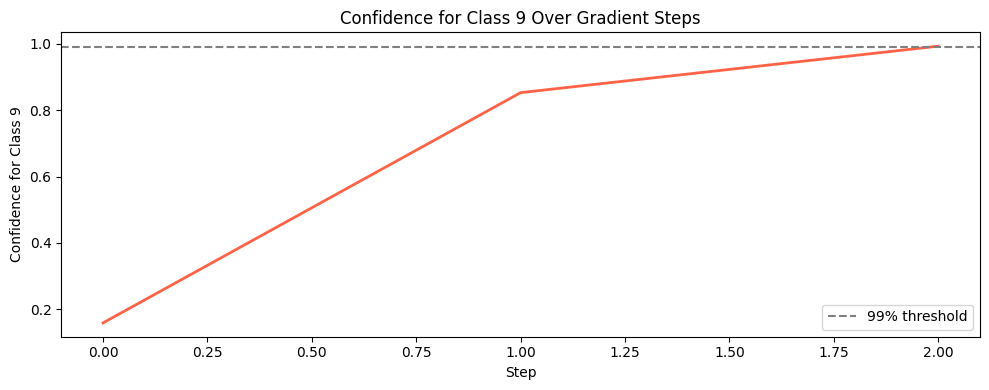

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.000, 0.997]

Initial prediction on pure noise: 8 (28.53% confidence)
Confidence for class 9:           14.14%
  Step    0 | Pred: 8 | Conf for 9: 14.14%

✔ Target reached at step 4 (confidence: 99.83%)

Final prediction: 9 (99.83% confidence)


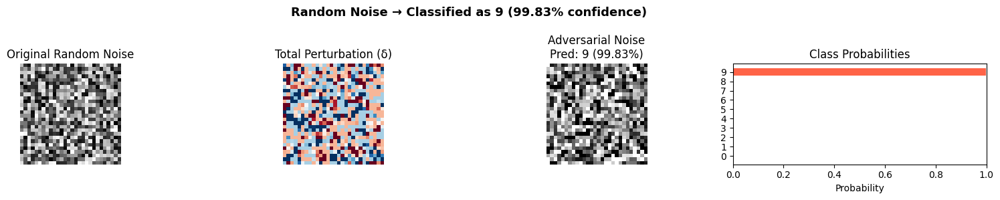

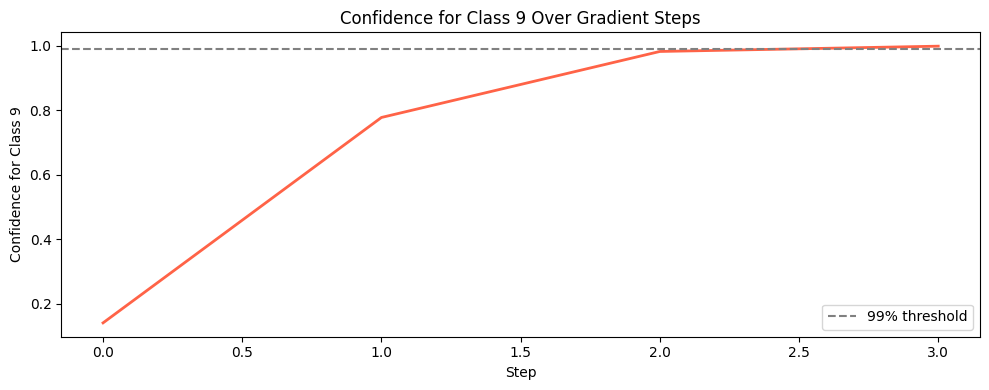

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.003, 1.000]

Initial prediction on pure noise: 8 (31.11% confidence)
Confidence for class 9:           13.49%
  Step    0 | Pred: 8 | Conf for 9: 13.49%

✔ Target reached at step 4 (confidence: 99.81%)

Final prediction: 9 (99.81% confidence)


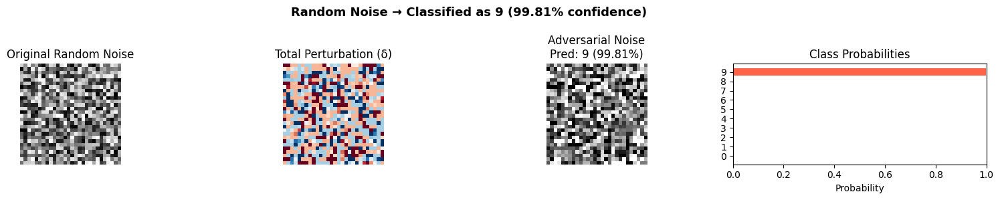

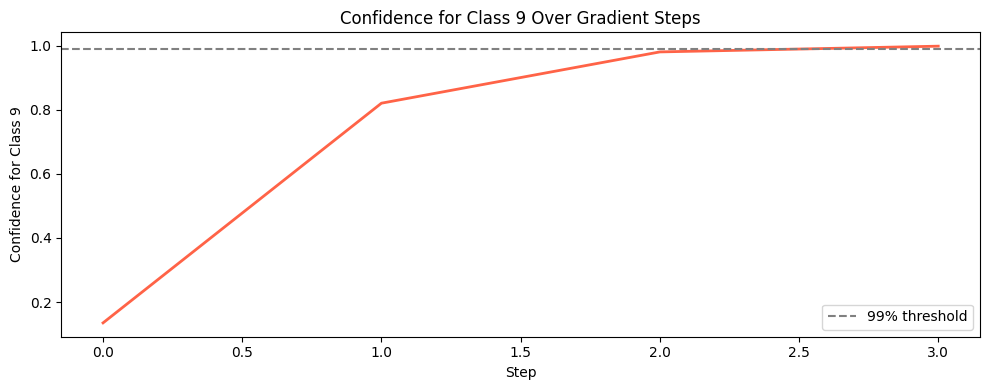

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.000, 0.999]

Initial prediction on pure noise: 8 (18.77% confidence)
Confidence for class 9:           11.78%
  Step    0 | Pred: 8 | Conf for 9: 11.78%

✔ Target reached at step 4 (confidence: 99.87%)

Final prediction: 9 (99.87% confidence)


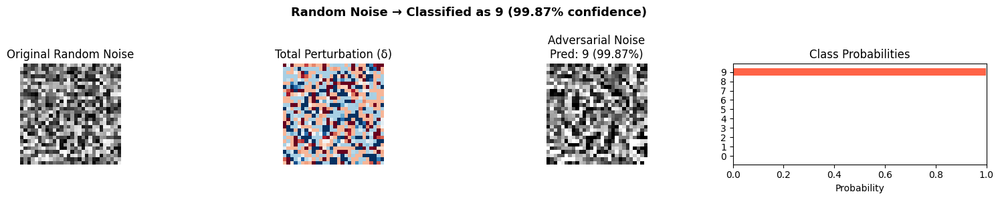

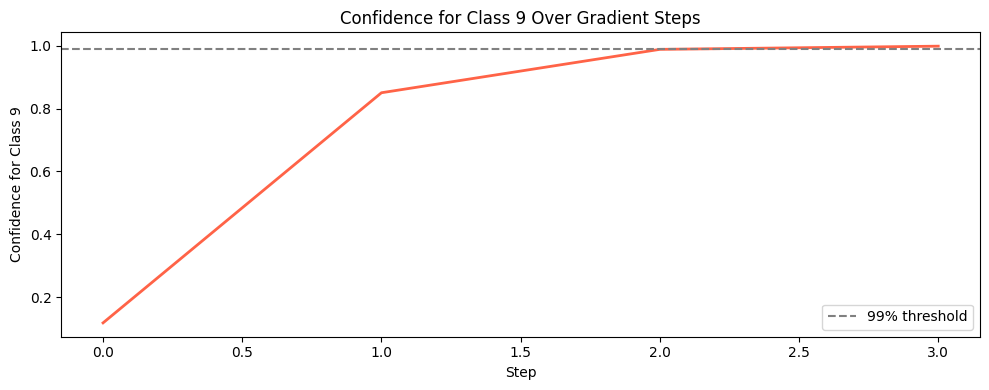

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.008, 1.000]

Initial prediction on pure noise: 8 (30.90% confidence)
Confidence for class 9:           7.01%
  Step    0 | Pred: 8 | Conf for 9: 7.01%

✔ Target reached at step 4 (confidence: 99.90%)

Final prediction: 9 (99.90% confidence)


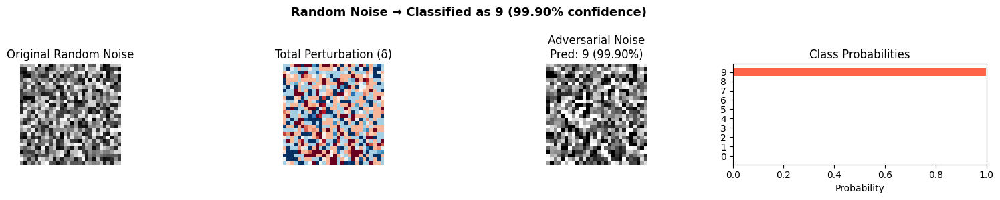

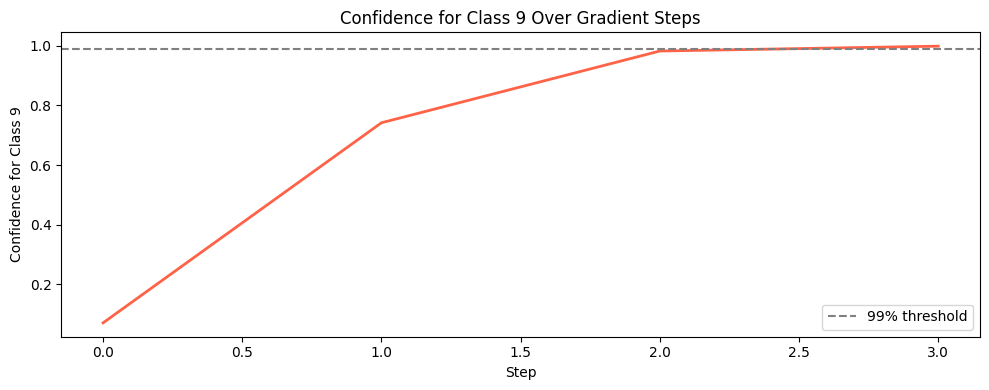

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.001, 0.999]

Initial prediction on pure noise: 8 (25.44% confidence)
Confidence for class 9:           17.14%
  Step    0 | Pred: 8 | Conf for 9: 17.14%

✔ Target reached at step 3 (confidence: 99.69%)

Final prediction: 9 (99.69% confidence)


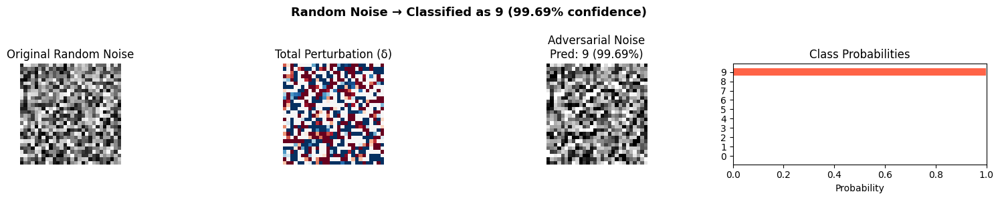

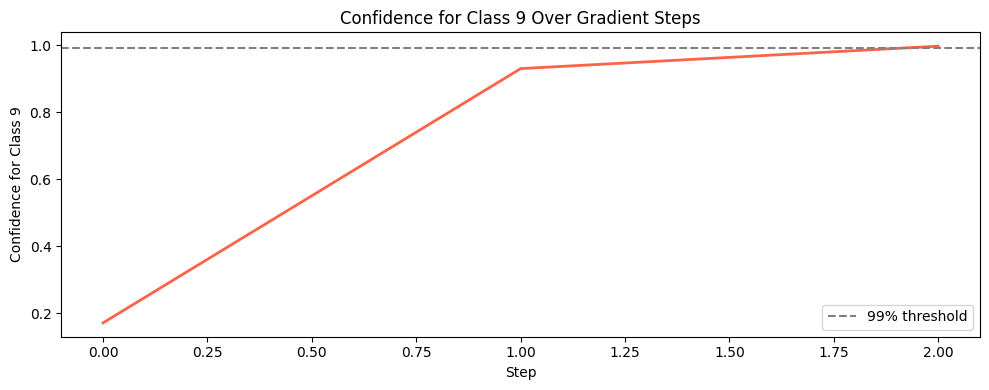

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.007, 0.999]

Initial prediction on pure noise: 8 (24.23% confidence)
Confidence for class 9:           14.32%
  Step    0 | Pred: 8 | Conf for 9: 14.32%

✔ Target reached at step 4 (confidence: 99.95%)

Final prediction: 9 (99.95% confidence)


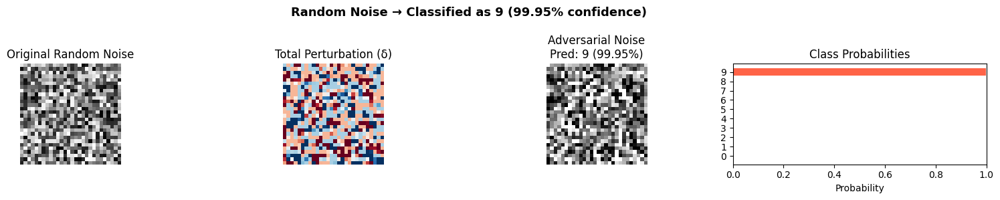

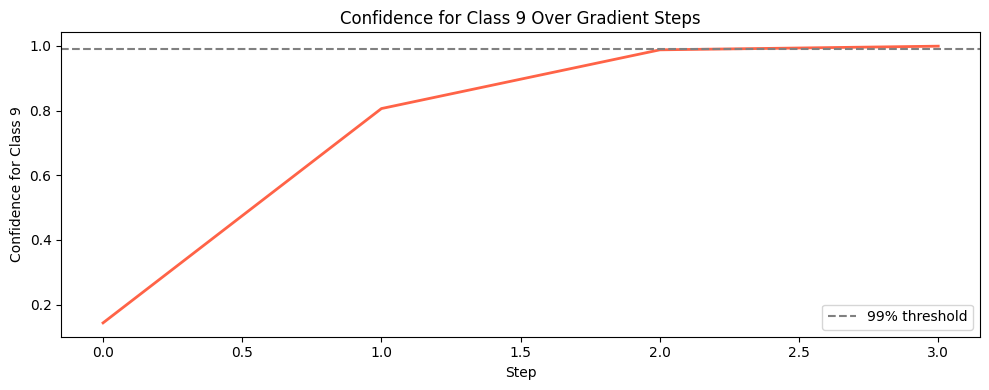

Noise image shape: torch.Size([1, 1, 28, 28])
Pixel value range: [0.000, 0.997]

Initial prediction on pure noise: 0 (23.10% confidence)
Confidence for class 9:           15.32%
  Step    0 | Pred: 0 | Conf for 9: 15.32%

✔ Target reached at step 4 (confidence: 99.74%)

Final prediction: 9 (99.74% confidence)


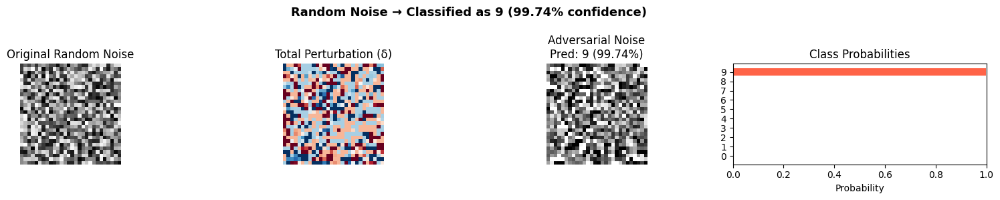

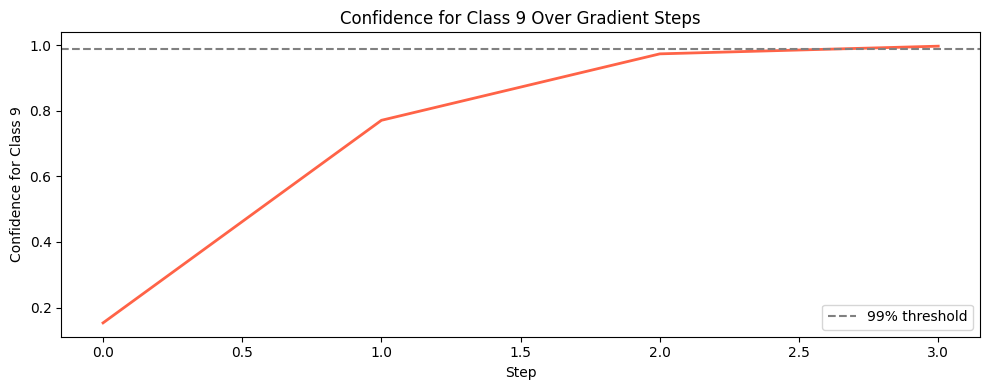

In [19]:
for i in range(32):
    torch.manual_seed(i)  # reproducibility
    noise_image = torch.rand(1, 1, 28, 28).to(device)

    print(f"Noise image shape: {noise_image.shape}")
    print(f"Pixel value range: [{noise_image.min():.3f}, {noise_image.max():.3f}]")
    
    # ─────────────────────────────────────────
    # 2. Check Initial Prediction on Noise
    # ─────────────────────────────────────────
    model.eval()
    
    with torch.no_grad():
        output     = model(noise_image)
        probs      = torch.softmax(output, dim=1).cpu().numpy()[0]
        pred_class = np.argmax(probs)
    
    print(f"\nInitial prediction on pure noise: {pred_class} ({probs[pred_class]:.2%} confidence)")
    print(f"Confidence for class 9:           {probs[9]:.2%}")
    
    # ─────────────────────────────────────────
    # 3. Iterative Gradient Descent to Fool
    #    Model into Predicting 9
    # ─────────────────────────────────────────
    criterion  = nn.CrossEntropyLoss()
    target     = torch.tensor([9]).to(device)
    
    LR         = 0.1
    NUM_STEPS  = 500
    createFromRandom(model, device, noise_image, NUM_STEPS, LR, criterion, target)